In [1]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

In [3]:
df_final = pd.read_csv("Climatologia/climatologia_todos_los_archivos.csv", encoding="utf-8")


In [4]:
df_final

,Longitud,Latitud,Altitud,Estacion,Estado,Municipio,Variable,2014-01-01,2014-01-02,2014-01-03,...,2024-12-22,2024-12-23,2024-12-24,2024-12-25,2024-12-26,2024-12-27,2024-12-28,2024-12-29,2024-12-30,2024-12-31
0,-108.931667,30.355278,1038.0,26205,SONORA,BACERAC,PRECIP,0.0,0.0,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,-108.931667,30.355278,1038.0,26205,SONORA,BACERAC,EVAP,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,-108.931667,30.355278,1038.0,26205,SONORA,BACERAC,TMAX,21.0,20.0,19.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,-108.931667,30.355278,1038.0,26205,SONORA,BACERAC,TMIN,1.0,-1.0,1.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,-99.551944,19.119167,2560.0,15295,MÉXICO,TENANGO DEL VALLE,PRECIP,0.0,0.0,0.0,...,0.0,11.2,2.2,2.7,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9963,-90.270000,19.845000,10.0,4023,CAMPECHE,CAMPECHE,TMIN,20.0,20.0,16.0,...,16.0,17.0,20.0,20.0,20.0,20.0,20.0,20.0,20.0,20.0
9964,-101.358333,26.641389,660.0,5167,COAHUILA DE ZARAGOZA,CASTAÑOS,PRECIP,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9965,-101.358333,26.641389,660.0,5167,COAHUILA DE ZARAGOZA,CASTAÑOS,EVAP,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9966,-101.358333,26.641389,660.0,5167,COAHUILA DE ZARAGOZA,CASTAÑOS,TMAX,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


Checamos cuantos Nan hay en promedio para cada variable

In [5]:
fecha_cols = df_final.columns[6:]  # columnas de fechas

# Total de valores por variable (número de fechas × cantidad de filas por variable)
total_valores_por_variable = df_final.groupby("Variable")[fecha_cols].size() * len(fecha_cols)

# Total de NaN por variable
nulls_por_variable = df_final.groupby("Variable")[fecha_cols].apply(lambda x: x.isnull().sum().sum())

# Porcentaje de NaN
porcentaje_nulls = df_final.groupby("Variable")[fecha_cols].apply(lambda x: x.isnull().sum().sum() / x.size * 100)
print(porcentaje_nulls)


Variable
EVAP      56.559602
PRECIP    18.588201
TMAX      22.370705
TMIN      22.370705
dtype: float64


Resulta que la mitad de los datos de EVAP son Nans, es decir, que faltan la mitad de los datos de las series de tiempo de EVAP

In [6]:
# Columnas de fechas
fecha_cols = df_final.columns[7:]

# Función para determinar si una fila supera el umbral de NaN
def fila_tiene_many_nans(fila, umbral=0.40):
    return fila[fecha_cols].isnull().mean() > umbral

# Listas para registrar info de eliminación
estaciones_a_eliminar = []
detalles_eliminacion = []

for estacion in df_final['Estacion'].unique():
    df_est = df_final[df_final['Estacion'] == estacion]
    
    # Filtrar solo TMAX, TMIN y PRECIP
    df_relevante = df_est[df_est['Variable'].isin(['TMAX','TMIN','PRECIP'])]
    
    # Revisar si alguna fila supera el umbral
    filas_problematicas = df_relevante.apply(fila_tiene_many_nans, axis=1)
    if filas_problematicas.any():
        estaciones_a_eliminar.append(estacion)
        # Registrar qué variables estaban por encima del umbral
        vars_problematicas = df_relevante.loc[filas_problematicas, 'Variable'].tolist()
        detalles_eliminacion.append((estacion, vars_problematicas))

# Filtrar las filas
df_limpio = df_final[~df_final['Estacion'].isin(estaciones_a_eliminar)]

# Resumen
print(f"Filas originales: {len(df_final)}, Filas después de limpiar: {len(df_limpio)}")
print(f"Se eliminaron {len(estaciones_a_eliminar)} estaciones.")
for estacion, vars_problem in detalles_eliminacion:
    print(f"- Estación {estacion} eliminada debido a variables con >40% NaN: {vars_problem}")


Filas originales: 9968, Filas después de limpiar: 7976
Se eliminaron 498 estaciones.
- Estación 15295 eliminada debido a variables con >40% NaN: ['TMAX', 'TMIN']
- Estación 11087 eliminada debido a variables con >40% NaN: ['PRECIP', 'TMAX', 'TMIN']
- Estación 10176 eliminada debido a variables con >40% NaN: ['PRECIP', 'TMAX', 'TMIN']
- Estación 24052 eliminada debido a variables con >40% NaN: ['PRECIP', 'TMAX', 'TMIN']
- Estación 16234 eliminada debido a variables con >40% NaN: ['PRECIP', 'TMAX', 'TMIN']
- Estación 20041 eliminada debido a variables con >40% NaN: ['PRECIP', 'TMAX', 'TMIN']
- Estación 30457 eliminada debido a variables con >40% NaN: ['PRECIP', 'TMAX', 'TMIN']
- Estación 19165 eliminada debido a variables con >40% NaN: ['TMAX', 'TMIN']
- Estación 24103 eliminada debido a variables con >40% NaN: ['PRECIP', 'TMAX', 'TMIN']
- Estación 30387 eliminada debido a variables con >40% NaN: ['PRECIP', 'TMAX', 'TMIN']
- Estación 27065 eliminada debido a variables con >40% NaN: ['PRE

In [7]:
import plotly.express as px
import pandas as pd

# Crear DataFrames de estaciones únicas
estaciones_finales = df_limpio.drop_duplicates(subset=['Estacion']).copy()
estaciones_finales['Estado_plot'] = 'Conservadas'

estaciones_eliminadas = df_final[~df_final['Estacion'].isin(df_limpio['Estacion'])].drop_duplicates(subset=['Estacion']).copy()
estaciones_eliminadas['Estado_plot'] = 'Eliminadas'

# Combinar
df_plot = pd.concat([estaciones_finales, estaciones_eliminadas])

# Scatter interactivo
fig = px.scatter(
    df_plot,
    x='Longitud',
    y='Latitud',
    color='Estado_plot',
    labels={'Longitud': 'Longitud', 'Latitud': 'Latitud', 'Estado_plot': 'Estado'},
    hover_data=['Estacion', 'Variable'],
    opacity=0.7,
    width=900,
    height=500
)

fig.update_layout(
    title='Estaciones antes y después de limpiar',
    legend_title='Estado de la estación'
)

fig.show()


In [93]:
df_limpio.isnull().sum().sum()

6943307

Notamos que EVAP tiene muchos Nan, entonces no es útil usar esta variable

In [9]:
df_limpio = df_limpio[df_limpio['Variable'] != 'EVAP']


In [11]:
df_limpio

,Longitud,Latitud,Altitud,Estacion,Estado,Municipio,Variable,2014-01-01,2014-01-02,2014-01-03,...,2024-12-22,2024-12-23,2024-12-24,2024-12-25,2024-12-26,2024-12-27,2024-12-28,2024-12-29,2024-12-30,2024-12-31
0,-108.931667,30.355278,1038.0,26205,SONORA,BACERAC,PRECIP,0.0,0.0,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,-108.931667,30.355278,1038.0,26205,SONORA,BACERAC,TMAX,21.0,20.0,19.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,-108.931667,30.355278,1038.0,26205,SONORA,BACERAC,TMIN,1.0,-1.0,1.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8,-104.773611,20.500556,1267.0,14035,JALISCO,MASCOTA,PRECIP,0.0,0.0,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
10,-104.773611,20.500556,1267.0,14035,JALISCO,MASCOTA,TMAX,18.5,23.5,24.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9958,-108.821667,26.766944,221.0,26314,SONORA,ÁLAMOS,TMAX,22.8,23.8,26.2,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9959,-108.821667,26.766944,221.0,26314,SONORA,ÁLAMOS,TMIN,13.3,13.1,14.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9960,-90.270000,19.845000,10.0,4023,CAMPECHE,CAMPECHE,PRECIP,6.0,20.0,6.0,...,0.0,0.0,0.0,0.0,0.0,2.0,0.0,0.0,0.0,0.0
9962,-90.270000,19.845000,10.0,4023,CAMPECHE,CAMPECHE,TMAX,32.0,29.0,27.0,...,27.0,28.0,31.0,32.0,33.0,32.0,34.0,32.0,34.0,33.0


In [13]:
df_limpio.to_csv("df_limpio_master_corregido.csv", index=False, encoding="utf-8")


In [99]:
import os

OUTPUT_MASTER = "/home/jorge/DocumentsWLS/datos_climatologicos_csv/df_limpio_master.csv"
os.makedirs(os.path.dirname(OUTPUT_MASTER), exist_ok=True)

df_limpio.to_csv(OUTPUT_MASTER, index=False, encoding="utf-8")
print(f"✅ Dataset limpio guardado: {OUTPUT_MASTER}")


✅ Dataset limpio guardado: /home/jorge/DocumentsWLS/datos_climatologicos_csv/df_limpio_master.csv


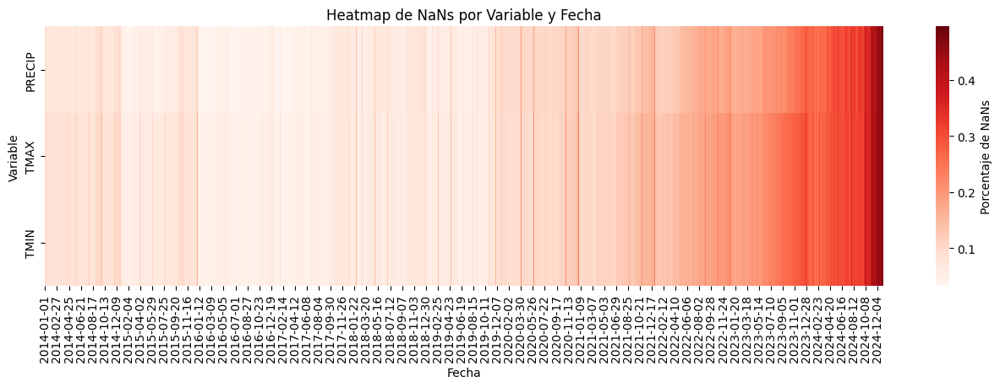

In [95]:
import matplotlib.pyplot as plt
import seaborn as sns

# Columnas de fechas
fecha_cols = df_limpio.columns[7:]  # Asegúrate que empiezan después de Variable, Estacion, etc.

# === 1. Heatmap por variable ===
# Crear un DataFrame de proporción de NaNs por variable y fecha
nan_matrix = df_limpio.groupby("Variable")[fecha_cols].apply(lambda x: x.isnull().mean())
plt.figure(figsize=(16, 4))
sns.heatmap(nan_matrix, cmap="Reds", cbar_kws={'label': 'Porcentaje de NaNs'})
plt.title("Heatmap de NaNs por Variable y Fecha")
plt.ylabel("Variable")
plt.xlabel("Fecha")
plt.show()


In [96]:
df_limpio.isnull().sum().sum()

2900417

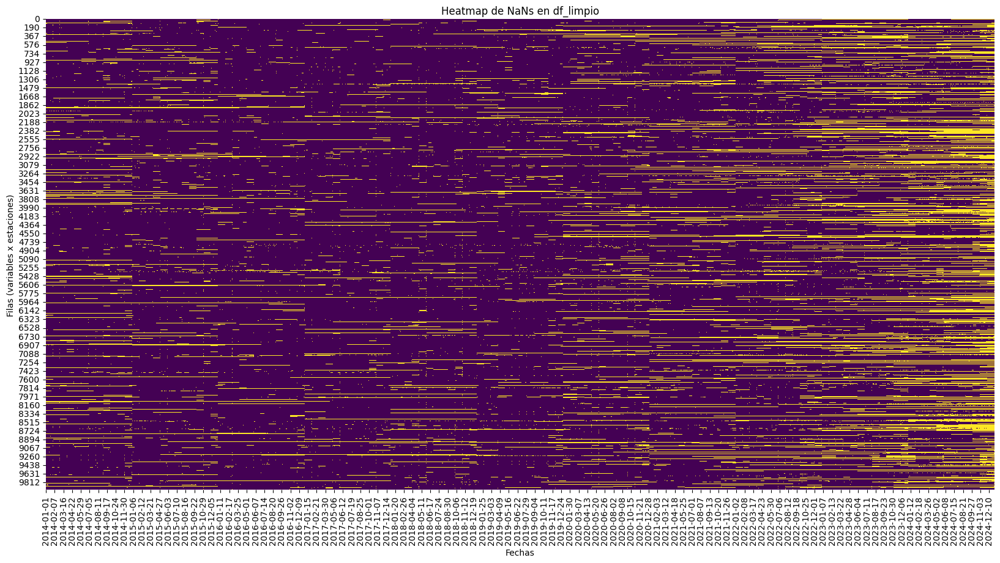

In [97]:
import matplotlib.pyplot as plt
import seaborn as sns

# Seleccionamos solo las columnas de fechas
fecha_cols = df_limpio.columns[7:]  # ajusta según tu DataFrame

# Plot
plt.figure(figsize=(20, 10))
sns.heatmap(df_limpio[fecha_cols].isnull(), cbar=False, cmap="viridis")  # True=NaN, False=valor presente
plt.xlabel("Fechas")
plt.ylabel("Filas (variables x estaciones)")
plt.title("Heatmap de NaNs en df_limpio")
plt.show()

In [98]:
df_limpio

,Longitud,Latitud,Altitud,Estacion,Estado,Municipio,Variable,2014-01-01,2014-01-02,2014-01-03,...,2024-12-22,2024-12-23,2024-12-24,2024-12-25,2024-12-26,2024-12-27,2024-12-28,2024-12-29,2024-12-30,2024-12-31
0,-108.931667,30.355278,1038.0,26205,SONORA,BACERAC,PRECIP,0.0,0.0,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,-108.931667,30.355278,1038.0,26205,SONORA,BACERAC,TMAX,21.0,20.0,19.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,-108.931667,30.355278,1038.0,26205,SONORA,BACERAC,TMIN,1.0,-1.0,1.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8,-104.773611,20.500556,1267.0,14035,JALISCO,MASCOTA,PRECIP,0.0,0.0,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
10,-104.773611,20.500556,1267.0,14035,JALISCO,MASCOTA,TMAX,18.5,23.5,24.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9958,-108.821667,26.766944,221.0,26314,SONORA,ÁLAMOS,TMAX,22.8,23.8,26.2,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9959,-108.821667,26.766944,221.0,26314,SONORA,ÁLAMOS,TMIN,13.3,13.1,14.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9960,-90.270000,19.845000,10.0,4023,CAMPECHE,CAMPECHE,PRECIP,6.0,20.0,6.0,...,0.0,0.0,0.0,0.0,0.0,2.0,0.0,0.0,0.0,0.0
9962,-90.270000,19.845000,10.0,4023,CAMPECHE,CAMPECHE,TMAX,32.0,29.0,27.0,...,27.0,28.0,31.0,32.0,33.0,32.0,34.0,32.0,34.0,33.0


In [7]:
import pandas as pd
df = pd.read_csv("Climatologia/climatologia_limpio.csv")

In [8]:
df['Variable']

KeyError: 'Variable'